In [1]:
#check if gpu is available for loading and training the model. 
import torch
from numba import cuda

if torch.cuda.is_available() == True:
    print("CUDA available")
else:
    print("CUDA not available")

CUDA available


In [2]:
import os
import copy
#import sfaira
import scvi
import anndata
import pynndescent
import numba
import numpy as np
import pandas as pd
import scanpy as sc
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
import scarches as sca
from scvi.model.utils import mde

/hpc/pmc_rios/2.personal/rariese/miniconda/envs/scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-12-09 10:55:57.532601: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-09 10:55:57.558894: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-09 10:55:57.567040: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2024-12-09 10:56:00.611428: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
 captum (see https://github.com/pytorch/captum).


In [3]:
torch.set_float32_matmul_precision('high')
sc.set_figure_params(figsize=(6, 6), frameon=False, dpi=300)
sns.set_theme()

In [4]:
# PARAMS
BATCH_SIZE = 1024
EPOCHS_PRETRAIN = 500
EPOCHS_FINETUNE = 100

# kwargs for model traineing

arches_params = dict(
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)

early_stopping_kwargs = {
    "early_stopping_metric": "val_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 10,
    "reduce_lr": True,
    "lr_patience": 5,
    "lr_factor": 0.1,
}

In [5]:
# functions

def harmonize_featurespace(adata):
    ds = sfaira.data.DatasetInteractive(
        data=adata,
        feature_symbol_col="index", # var column containing gene names
        feature_id_col=None, # var column containing ensembl ids
    )
    ds.organism = "Homo sapiens"
    ds.streamline_features(match_to_release="104", subset_genes_to_type="protein_coding")
    return ds.adata

def subset_and_pad_adata(gene_set, adata):
    """
    This function uses a gene list provided as a Pandas dataframe with gene symbols and
    Ensembl IDs and subsets a larger Anndata object to only the genes in this list. If
    Not all genes are found in the AnnData object, then zero-padding is performed.
    """
    # Example inputs:
    # genes_filename = '/storage/groups/ml01/workspace/hlca_lisa.sikkema_malte.luecken/genes_for_mapping.csv'
    # data_filename = '/storage/groups/ml01/workspace/hlca_lisa.sikkema_malte.luecken/ready/adams.h5ad'
    # gene_set = pd.read_csv(genes_filename)
    # adata = sc.read(data_filename)

    # Prep objects
    if 'gene_symbol' in gene_set.columns:
        gene_set.index = gene_set['gene_symbol']

    else:
        raise ValueError('The input gene list was not of the expected type!\n'
                         'Gene symbols and ensembl IDs are expected in column names:\n'
                         '\t`gene_symbols` and `Unnamed: 0`')

    # Subset adata object
    common_genes = [gene for gene in gene_set['gene_symbol'].values if gene in adata.var_names]
    if len(common_genes) == 0:
        print("WARNING: YOU SHOULD PROBABLY SWITCH YOUR ADATA.VAR INDEX COLUMN TO GENE NAMES"
                  " RATHER THAN IDS! No genes were recovered.")
        return

    adata_sub = adata[:,common_genes].copy()

    # Pad object with 0 genes if needed
    if len(common_genes) < len(gene_set):
        diff = len(gene_set) - len(common_genes)
        print(f'not all genes were recovered, filling in 0 counts for {diff} missing genes...')
        
        # Genes to pad with
        genes_to_add = set(gene_set['gene_symbol'].values).difference(set(adata_sub.var_names))
        genes_to_add = list(genes_to_add)
        new_var = gene_set.loc[genes_to_add]
        
        if 'Unnamed: 0' in new_var.columns:
            # Assumes the unnamed column are ensembl values
            new_var['ensembl'] = new_var['Unnamed: 0']
            del new_var['Unnamed: 0']

        df_padding = pd.DataFrame(data=np.zeros((adata_sub.shape[0],len(genes_to_add))), index=adata_sub.obs_names, columns=new_var.index)
        adata_padding = sc.AnnData(df_padding, var=new_var)
        
        # Concatenate object
        adata_sub = ad.concat([adata_sub, adata_padding], axis=1, join='inner', index_unique=None, merge='unique')
        
    return adata_sub

def plot_umap_grid(adata, color, basis='umap', ncols=3, **umap_args):
    """
    Plots a grid of UMAP visualizations for each unique value in a specified color variable,
    showing the selected group in color and the rest in grey.

    Parameters:
        adata (AnnData): The annotated data matrix.
        color (str): The column name in adata.obs to use for grouping and coloring.
        basis (str): The embedding basis to use (default is 'umap').
        ncols (int): Number of columns for the grid layout.
        **umap_args: Additional arguments to pass to sc.pl.embedding.
    """
    # Get all unique values in the specified color variable
    unique_groups = adata.obs[color].unique()
    n_groups = len(unique_groups)
    nrows = (n_groups + ncols - 1) // ncols  # Calculate the number of rows needed

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 5 * nrows))
    axes = axes.flatten() if n_groups > 1 else [axes]

    for i, group in enumerate(unique_groups):
        # Plot the UMAP for the current group, highlighting it and greying out the rest
        sc.pl.embedding(
            adata,
            basis=basis,
            color=color,
            ax=axes[i],
            show=False,
            groups=[group],  # Highlight only the current group
            **umap_args
        )
        axes[i].set_title(f"{color}: {group}")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

In [6]:
scvi_model_path='/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/Braun_dev_brain/models/scvi'
scanvi_model_path='/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/Braun_dev_brain/models/scanvi/model.pt/'
ref_adata_path='/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/Braun_dev_brain/Braun_HDBCA_HNOCA-harmonized_2khvg.h5ad'
query_adata_path='/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_annotated_integrated.h5ad'

# Load reference model and data

In [7]:
ref_adata = sc.read_h5ad(ref_adata_path)

In [8]:
ref_adata.obs["batch"] = ref_adata.obs["donor_id"].astype(str).copy()

In [9]:
ref_adata.X = ref_adata.layers['counts'].copy()

In [10]:
ref_adata.obs['CellClass_Mossi'].replace('Failed', 'COP', inplace=True)
ref_adata = ref_adata[ref_adata.obs['CellClass_Mossi']!='No mapping'].copy()

/scratch/29048099/ipykernel_2728957/3877700377.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ref_adata.obs['CellClass_Mossi'].replace('Failed', 'COP', inplace=True)
/scratch/29048099/ipykernel_2728957/3877700377.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  ref_adata.obs['CellClass_Mossi'].replace('Faile

In [11]:
lvae = scvi.model.SCANVI.load(dir_path='/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/Braun_dev_brain/models/scanvi/model.pt', adata=ref_adata)

INFO     File                                                                                                      
         /hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/Braun_dev_brain/models/scanvi/model.p
         t/model.pt already downloaded                                                                             


/hpc/pmc_rios/2.personal/rariese/miniconda/envs/scanpy/lib/python3.11/site-packages/scvi/model/base/_save_load.py:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = t

# Load query data and harmonize

In [ ]:
query_adata = sc.read_h5ad(query_adata_path)

In [13]:
query_adata.X = query_adata.layers['counts'].copy()

In [14]:
del query_adata.varm

In [15]:
query_adata.obs["batch"] = query_adata.obs["Day"]

In [16]:
query_adata.obs["CellClass"] = "Unknown"
query_adata.obs["CellClass_Mossi"] = "Unknown"
query_adata.obs["Region"] = "Unknown"
query_adata.obs["Subregion"] = "Unknown"
query_adata.obs["Age"] = "=Unknown"

# Load query in SCANVI model

In [17]:
scvi.model.SCANVI.prepare_query_anndata(query_adata, lvae)

INFO     Found 99.65% reference vars in query data.                                                                


In [18]:
vae_q = scvi.model.SCANVI.load_query_data(query_adata, lvae)

In [19]:
vae_q.train(
    batch_size=1024,
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=1,
)

INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-GPU-813e9040-38b5-0f9d-9d39-1010f827161f/3/0]


Epoch 100/100: 100%|██████████| 100/100 [04:24<00:00,  1.97s/it, v_num=1, train_loss_step=934, train_loss_epoch=950]    

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [04:24<00:00,  2.65s/it, v_num=1, train_loss_step=934, train_loss_epoch=950]


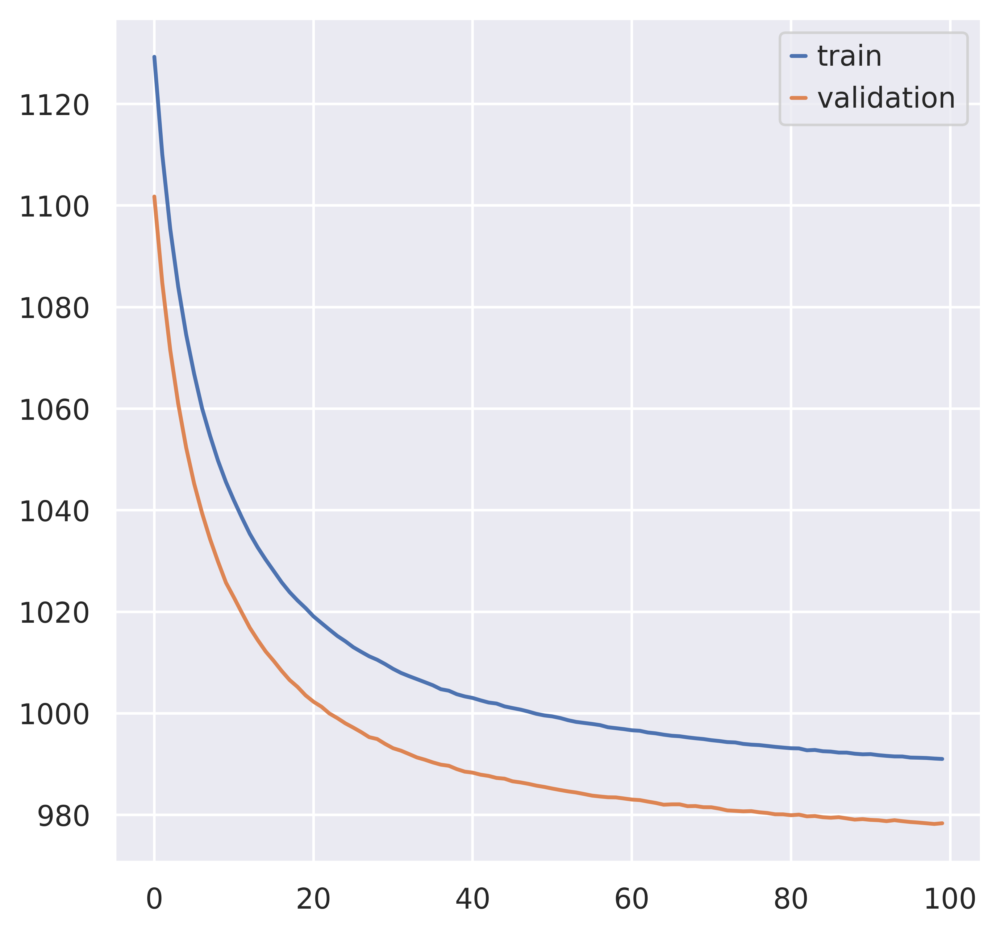

In [20]:
plt.plot(vae_q.history['elbo_train']['elbo_train'], label='train');
plt.plot(vae_q.history['elbo_validation']['elbo_validation'], label='validation');
plt.legend()

## Transfer labels

In [ ]:
query_adata.obs['CellClass_Mossi'] = vae_q.predict()

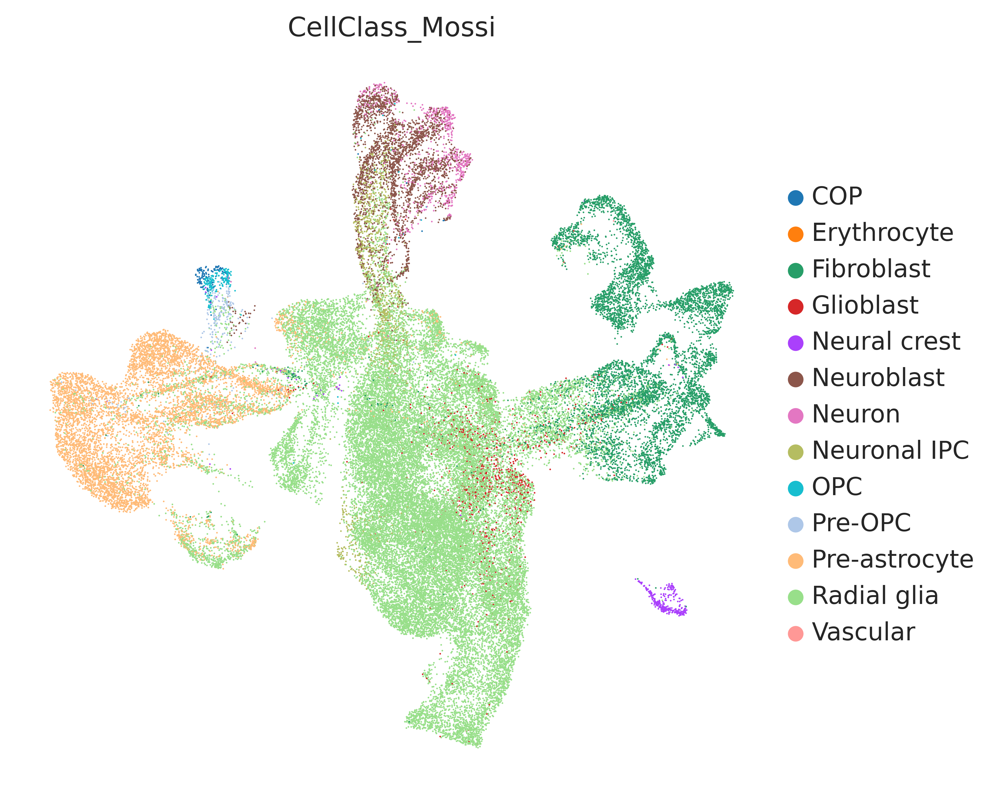

In [ ]:
sc.pl.embedding(query_adata, basis='umap_scpoli', color='CellClass_Mossi')

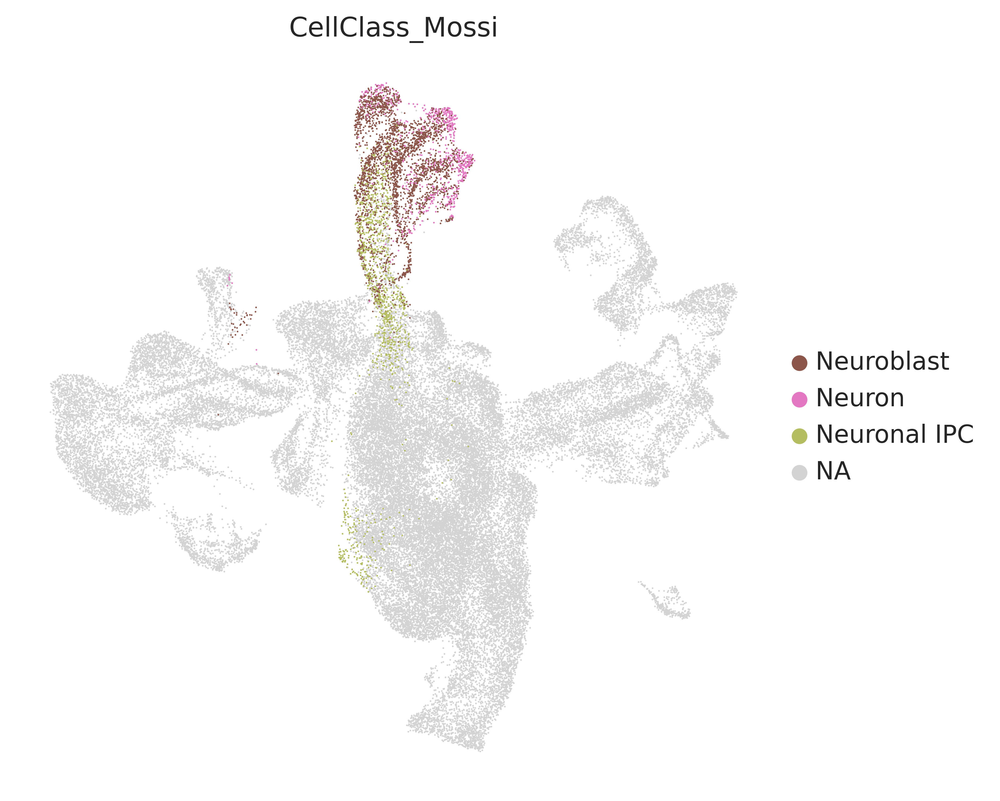

In [ ]:
sc.pl.embedding(query_adata, basis='umap_scpoli', color='CellClass_Mossi', groups=['Neuroblast','Neuronal IPC','Neuron'])

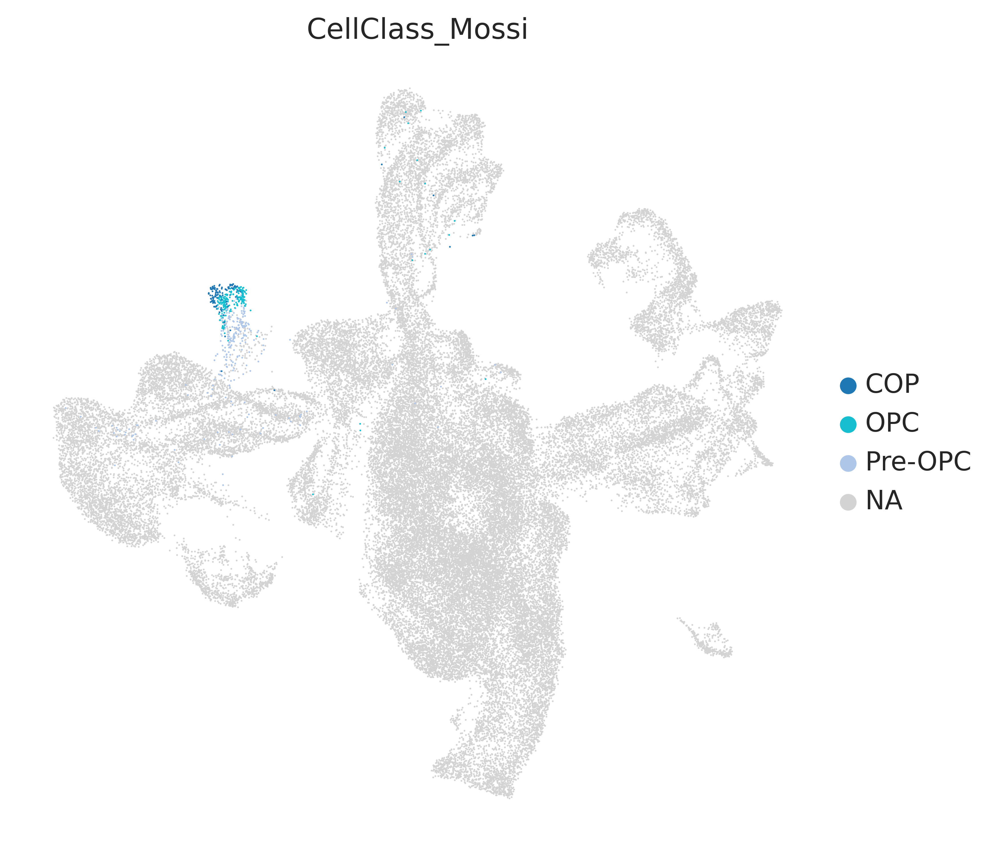

In [ ]:
sc.pl.embedding(query_adata, basis='umap_scpoli', color='CellClass_Mossi', groups=['Pre-OPC','OPC','COP'])

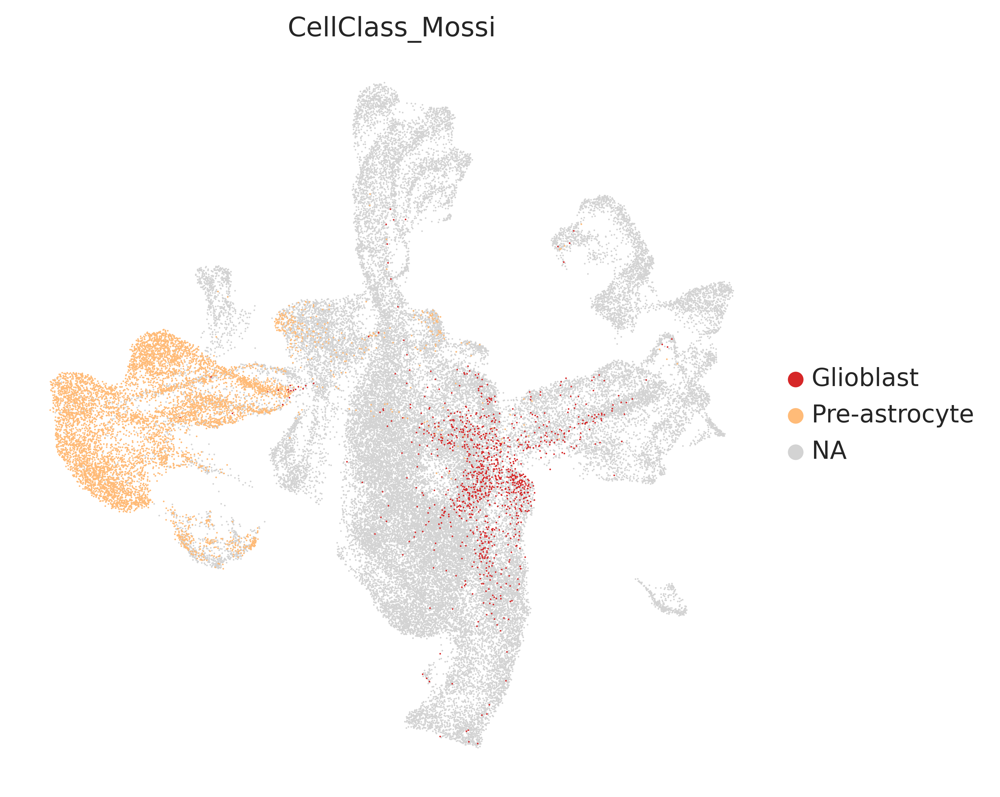

In [ ]:
sc.pl.embedding(query_adata, basis='umap_scpoli', color='CellClass_Mossi', groups=['Glioblast','Pre-astrocyte'])

In [ ]:
sc.pp.neighbors(query_adata, use_rep='X_scpoli', key_added='scpoli')

In [ ]:
sc.tl.leiden(query_adata, resolution=4, neighbors_key='scpoli', key_added='scpoli_leiden_res4')

In [ ]:
sc.tl.leiden(query_adata, resolution=40, neighbors_key='scpoli', key_added='scpoli_leiden_res40')

In [ ]:
df = query_adata.obs[['scpoli_leiden_res40', "CellClass_Mossi"]]
# Filter out 'Unknown' annotations
cluster_annotation = df.groupby('scpoli_leiden_res40')['CellClass_Mossi'].agg(lambda x: x.mode()[0])
query_adata.obs['hdbca_mossi_level_1'] = query_adata.obs['scpoli_leiden_res40'].map(cluster_annotation)
query_adata.obs['hdbca_mossi_level_1'] = query_adata.obs['hdbca_mossi_level_1'].cat.remove_unused_categories()

/scratch/28333441/ipykernel_2887992/3332008528.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_annotation = df.groupby('scpoli_leiden_res40')['CellClass_Mossi'].agg(lambda x: x.mode()[0])


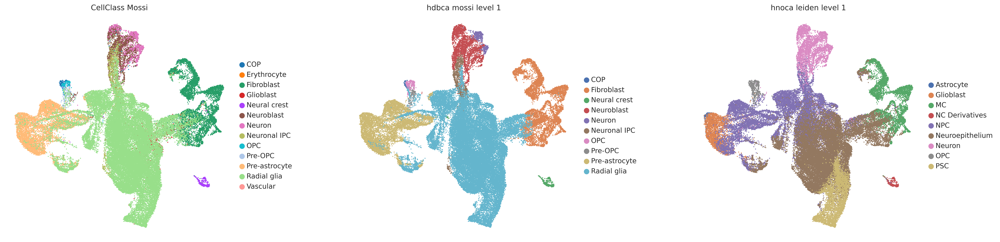

In [ ]:
sc.pl.scatter(query_adata, basis="umap_scpoli", color=['CellClass_Mossi','hdbca_mossi_level_1','hnoca_leiden_level_1'], size=10)

In [52]:
query_adata.write_h5ad('/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_annotated_mossi_integrated.h5ad')